### 导入原始数据

#### 导入需要的数据库

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pyecharts import options as opts
from pyecharts.charts import Bar
from scipy.stats import ttest_ind

In [2]:
df=pd.DataFrame(pd.read_excel(r"/Users/zhaokai/PycharmProjects/data_e1/sub_a.xlsx",index_col=1))

In [3]:
df

,sub,Block,Sex,Age,type,ACC,RT,pj_rp,pj_rt,xnum,d,d1,group
trial,,,,,,,,,,,,,
1,sub001,1,2,24,1,1,311,36,624,36,0.0,0.0,1
2,sub001,1,2,24,1,1,552,-6,763,-36,30.0,30.0,1
4,sub001,1,2,24,1,1,281,36,535,36,0.0,0.0,1
5,sub001,1,2,24,1,1,421,36,756,-36,72.0,72.0,1
7,sub001,1,2,24,1,1,469,-6,1028,-36,30.0,30.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,sub109,6,1,22,1,1,416,-6,1112,-36,30.0,30.0,2
597,sub109,6,1,22,1,1,263,6,682,36,30.0,-30.0,2
598,sub109,6,1,22,1,1,76,36,700,36,0.0,0.0,2


### 数据清洗

In [4]:
# 空数据过滤
df.isnull()
df.dropna()

,sub,Block,Sex,Age,type,ACC,RT,pj_rp,pj_rt,xnum,d,d1,group
trial,,,,,,,,,,,,,
1,sub001,1,2,24,1,1,311,36,624,36,0.0,0.0,1
2,sub001,1,2,24,1,1,552,-6,763,-36,30.0,30.0,1
4,sub001,1,2,24,1,1,281,36,535,36,0.0,0.0,1
5,sub001,1,2,24,1,1,421,36,756,-36,72.0,72.0,1
7,sub001,1,2,24,1,1,469,-6,1028,-36,30.0,30.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,sub109,6,1,22,1,1,416,-6,1112,-36,30.0,30.0,2
597,sub109,6,1,22,1,1,263,6,682,36,30.0,-30.0,2
598,sub109,6,1,22,1,1,76,36,700,36,0.0,0.0,2


In [5]:
# 初步筛选数据
cond1 = df["type"]==1 
cond2 = df["ACC"]==1
cond = cond1 & cond2
df[cond]

,sub,Block,Sex,Age,type,ACC,RT,pj_rp,pj_rt,xnum,d,d1,group
trial,,,,,,,,,,,,,
1,sub001,1,2,24,1,1,311,36,624,36,0.0,0.0,1
2,sub001,1,2,24,1,1,552,-6,763,-36,30.0,30.0,1
4,sub001,1,2,24,1,1,281,36,535,36,0.0,0.0,1
5,sub001,1,2,24,1,1,421,36,756,-36,72.0,72.0,1
7,sub001,1,2,24,1,1,469,-6,1028,-36,30.0,30.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,sub109,6,1,22,1,1,416,-6,1112,-36,30.0,30.0,2
597,sub109,6,1,22,1,1,263,6,682,36,30.0,-30.0,2
598,sub109,6,1,22,1,1,76,36,700,36,0.0,0.0,2


#### 查看数据分布

In [6]:
m = df.groupby(by=["sub"])[["RT","pj_rt","xnum","d","d1"]]
d = df.groupby(by=["sub"])[["RT","pj_rt","xnum","d","d1"]]
print(m.mean().round(2),d.std().round(2))

            RT   pj_rt   xnum      d     d1
sub                                        
sub001  254.48  656.71  -0.63  23.87  19.43
sub002  351.42  370.86  -2.06  30.47  23.01
sub003  391.19  667.61  -0.86  19.14   9.22
sub004  439.68  193.42  -9.71  26.92  13.26
sub005  318.70  326.31  -4.83  30.35  10.19
sub006  434.48  360.69  -3.77  28.00   8.98
sub008  347.02  248.81  -3.31  20.66   7.20
sub010  252.87  118.56   2.60  22.86  12.70
sub012  477.56  333.75 -11.30  23.25   2.98
sub101  299.04  484.46   2.38  19.46  14.94
sub102  260.77  297.64   2.32  24.31  11.65
sub103  391.19  667.61  -0.86  19.14   9.22
sub104  241.46  335.53   0.31  21.97   1.00
sub105  271.75  417.62  -0.93  22.36   3.43
sub106  311.95  574.61  -2.20  19.40   6.96
sub107  298.05  380.29   0.43  21.84   7.11
sub108  310.76  523.55   1.38  18.25   5.96
sub109  232.91  598.23   2.23  21.18  14.36             RT   pj_rt   xnum      d     d1
sub                                        
sub001  136.20  157.89  31.48  2

#### 筛选数据

In [7]:
a = df["sub"].unique()
print(a)

['sub001' 'sub002' 'sub003' 'sub004' 'sub005' 'sub006' 'sub008' 'sub010'
 'sub012' 'sub101' 'sub102' 'sub103' 'sub104' 'sub105' 'sub106' 'sub107'
 'sub108' 'sub109']


In [8]:
list1 = ['sub001' ,'sub002', 'sub003', 'sub004', 'sub005', 'sub006', 'sub008', 'sub010',
 'sub012', 'sub101' ,'sub102' ,'sub103' ,'sub104' ,'sub105' ,'sub106', 'sub107',
 'sub108', 'sub109']

In [9]:
for i in list1:
    cond1 = df["sub"]==i
    b = a['RT']
    cond2 = b <=50 
    cond3 = b >=(b.mean()+3*b.std())
    a_ = df[cond1 & cond2 & cond3]
    c = df['pj_rt']
    cond4 = c <=100 
    cond5 = c >= (c.mean()+3*c.std())
    b_ = df[cond1 & cond4 & cond5]

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

### 查看数据分布

#### 不同 block下的数据分布

In [10]:
m = df.groupby(by=["sub","Block"])[["RT","pj_rt","xnum","d","d1"]]
d = df.groupby(by=["sub","Block"])[["RT","pj_rt","xnum","d","d1"]]
print(m.mean().round(2).stack(),d.std().round(2).stack())

sub     Block       
sub001  1      RT       348.60
               pj_rt    633.31
               xnum       2.29
               d         26.74
               d1        17.38
                         ...  
sub109  6      RT       287.06
               pj_rt    729.06
               xnum       2.12
               d         19.11
               d1        10.06
Length: 540, dtype: float64 sub     Block       
sub001  1      RT        91.91
               pj_rt    141.34
               xnum      31.17
               d         23.76
               d1        31.36
                         ...  
sub109  6      RT       113.16
               pj_rt    185.83
               xnum      31.88
               d         23.48
               d1        28.62
Length: 540, dtype: float64


In [ ]:
# 透视表，其实就是分组聚合：city然后根据 workYear，默认计算的平均值
w = m.pivot_table(index="sub",columns="Block",values="RT") # 透视表

data = w.values
data = np.repeat(data,4,axis = 1) # 重复4次，目的画图，美观，图片宽度拉大
plt.figure(figsize=(12,9))

plt.imshow(data,cmap='RdBu_r')

# 设置刻度
plt.yticks(np.arange(13),w.index)
plt.xticks(np.array([1.5,5.5,9.5,13.5]),w.columns)

# 绘制文本
h,w = data.shape
for x in range(w):
    for y in range(h):
        if (x%4 == 0) and (~np.isnan(data[y,x])):
            text = plt.text(x + 1.5, y, round(data[y,x],1),
                           ha="center", va="center", color='r',fontsize = 16)
            
plt.colorbar(shrink = 0.85)
plt.tick_params(labelsize = 16)

#### 各个奖罚条件下的数据

-36    2342
 36    2024
 6     1351
-6     1189
Name: xnum, dtype: int64

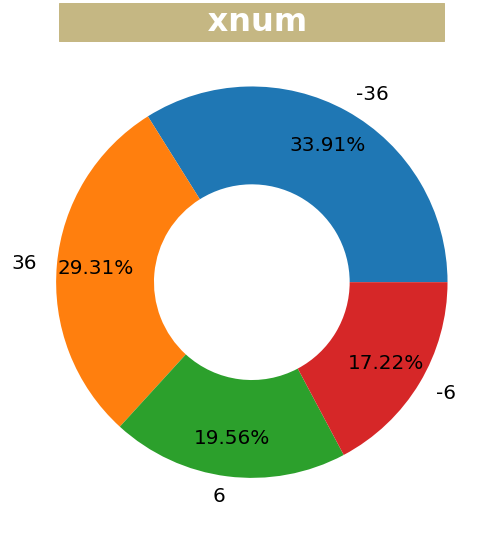

In [11]:
jl = df["xnum"].value_counts(normalize=False)
display(jl)

plt.figure(figsize=(9,9))
_ = plt.pie(jl, # 数据统计
            labels=jl.index,# 标签
            autopct='%0.2f%%',# 显示百分比
            wedgeprops=dict(linewidth=3,width = 0.5),# 设置环
            pctdistance=0.80,# 百分比位置
            textprops = dict(fontsize = 20))# 字体大小

_ = plt.title(label='             xnum            ', 
          fontsize=32, weight='bold', 
          color='white', backgroundcolor='#c5b783')

#### 每个被试各个block下的数据分布

/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


sub     Block
sub001  1        AxesSubplot(0.125,0.125;0.775x0.755)
        2        AxesSubplot(0.125,0.125;0.775x0.755)
        3        AxesSubplot(0.125,0.125;0.775x0.755)
        4        AxesSubplot(0.125,0.125;0.775x0.755)
        5        AxesSubplot(0.125,0.125;0.775x0.755)
                                 ...                 
sub109  2        AxesSubplot(0.125,0.125;0.775x0.755)
        3        AxesSubplot(0.125,0.125;0.775x0.755)
        4        AxesSubplot(0.125,0.125;0.775x0.755)
        5        AxesSubplot(0.125,0.125;0.775x0.755)
        6        AxesSubplot(0.125,0.125;0.775x0.755)
Length: 108, dtype: object

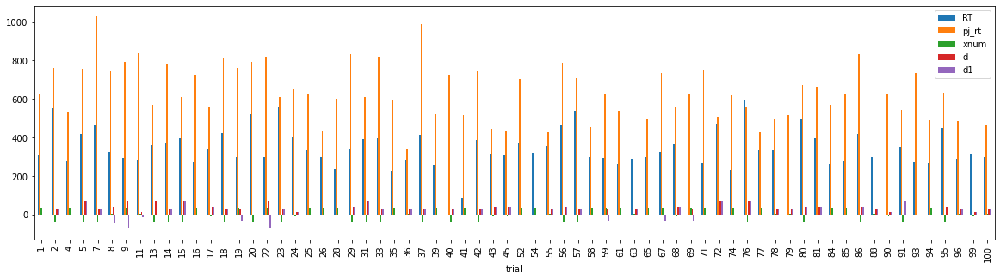

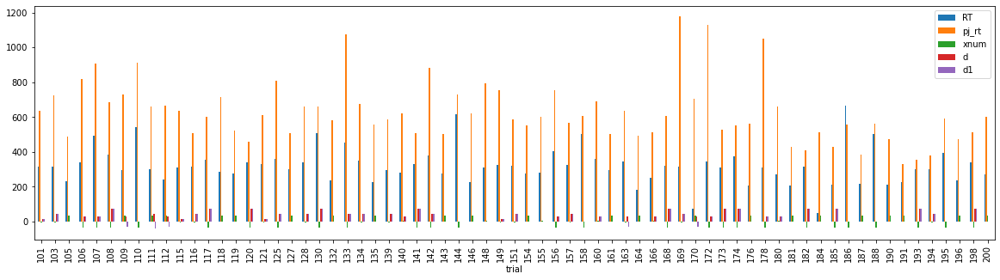

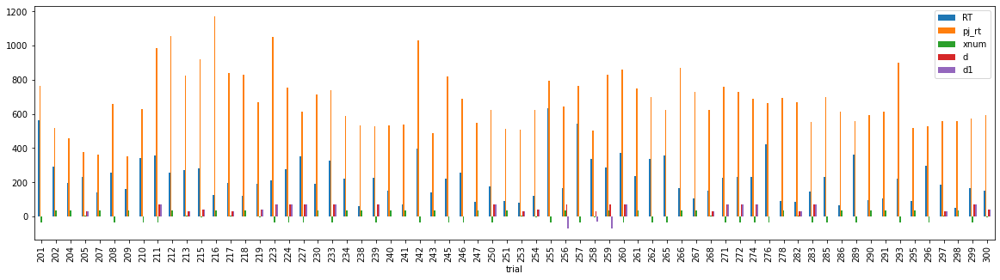

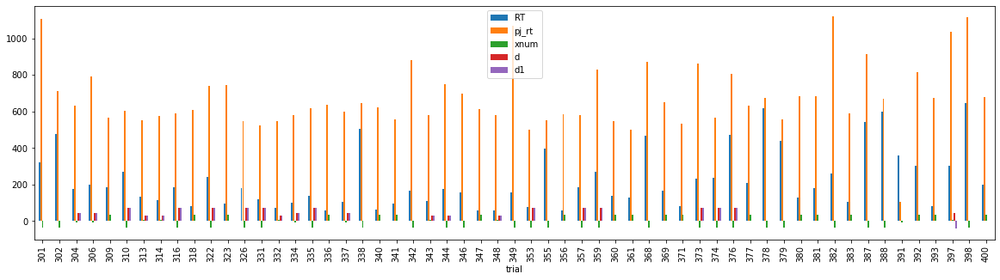

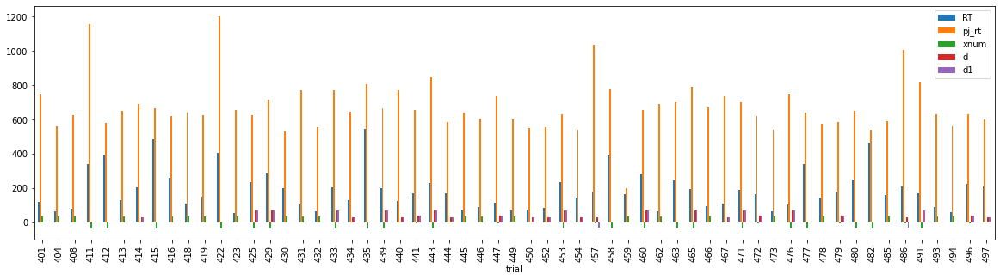

...

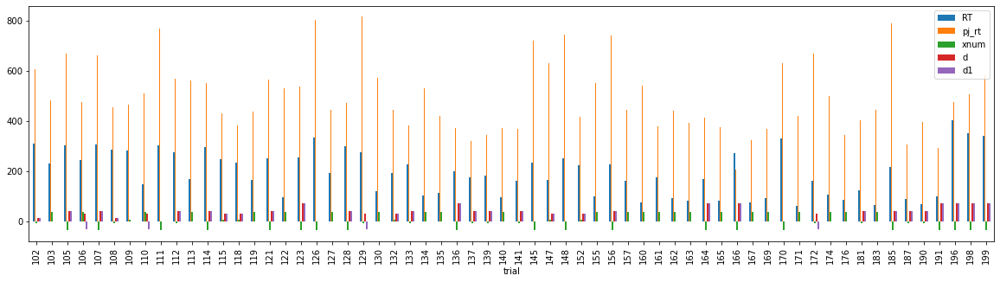

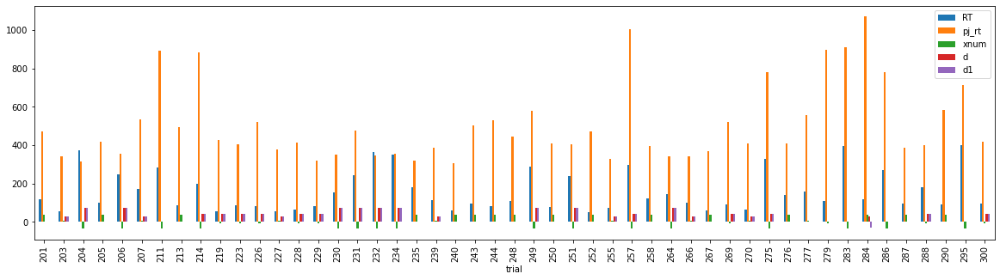

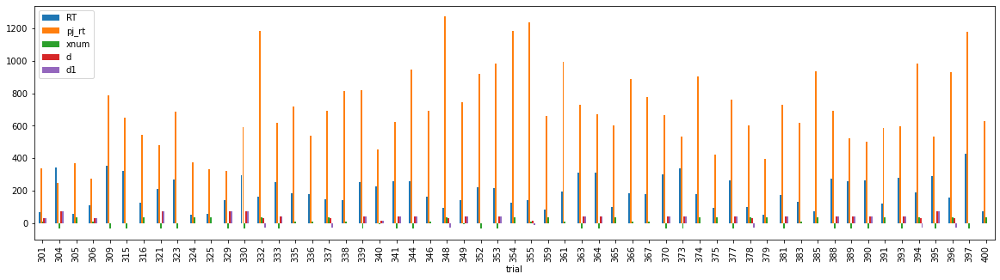

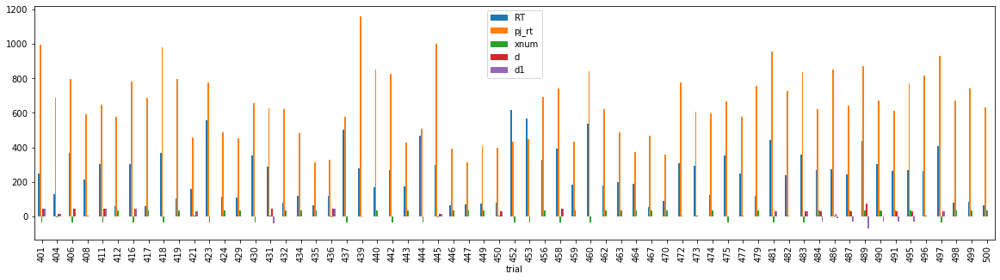

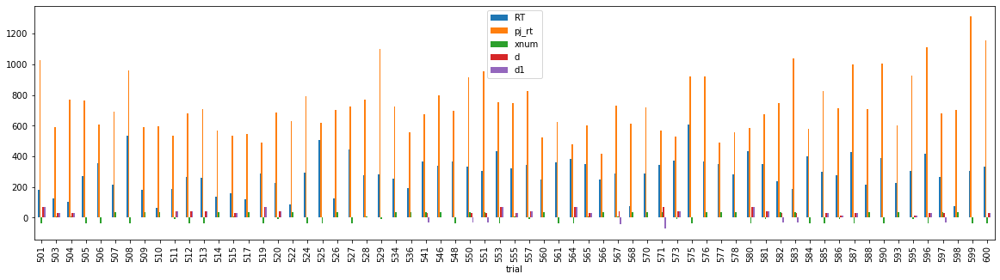

In [12]:
m.plot.bar(figsize=(20,5))

/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


sub     Block
sub001  1        AxesSubplot(0.125,0.125;0.775x0.755)
        2        AxesSubplot(0.125,0.125;0.775x0.755)
        3        AxesSubplot(0.125,0.125;0.775x0.755)
        4        AxesSubplot(0.125,0.125;0.775x0.755)
        5        AxesSubplot(0.125,0.125;0.775x0.755)
                                 ...                 
sub109  2        AxesSubplot(0.125,0.125;0.775x0.755)
        3        AxesSubplot(0.125,0.125;0.775x0.755)
        4        AxesSubplot(0.125,0.125;0.775x0.755)
        5        AxesSubplot(0.125,0.125;0.775x0.755)
        6        AxesSubplot(0.125,0.125;0.775x0.755)
Length: 108, dtype: object

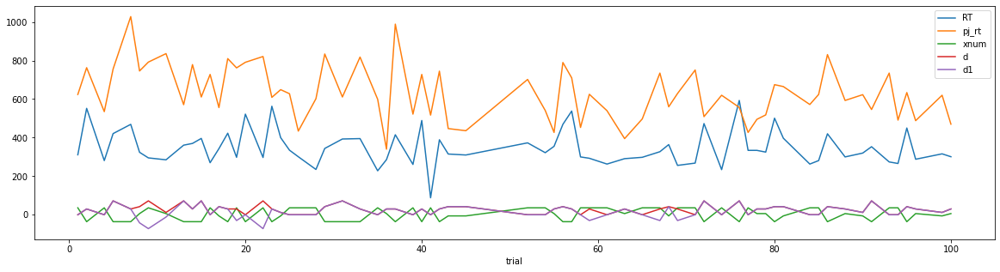

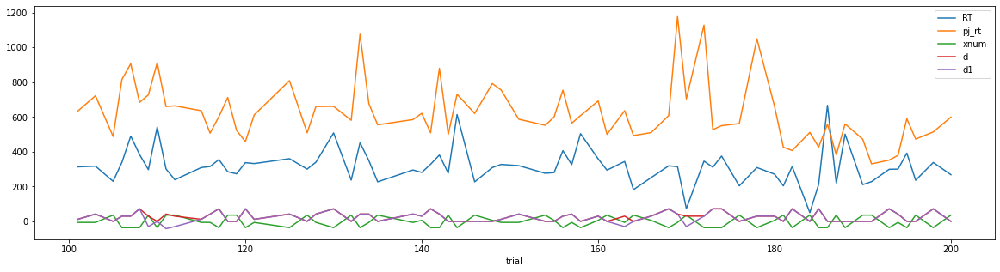

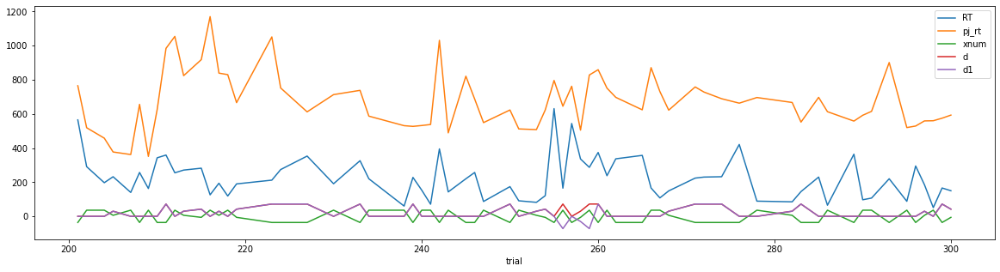

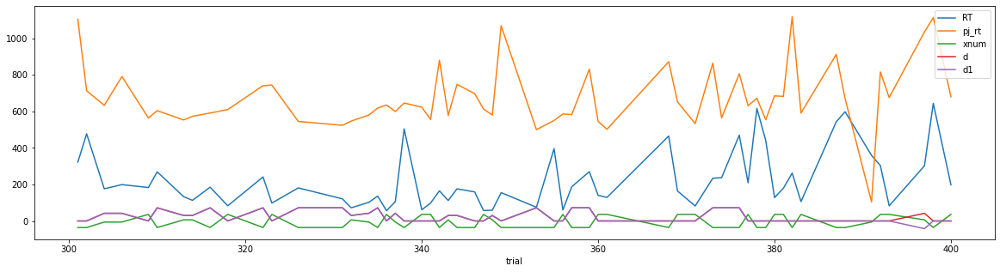

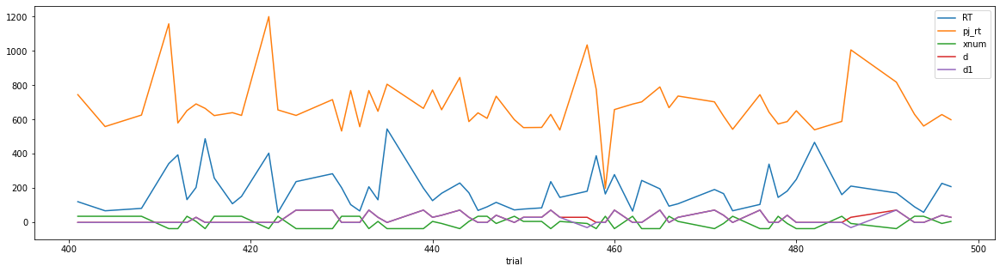

...

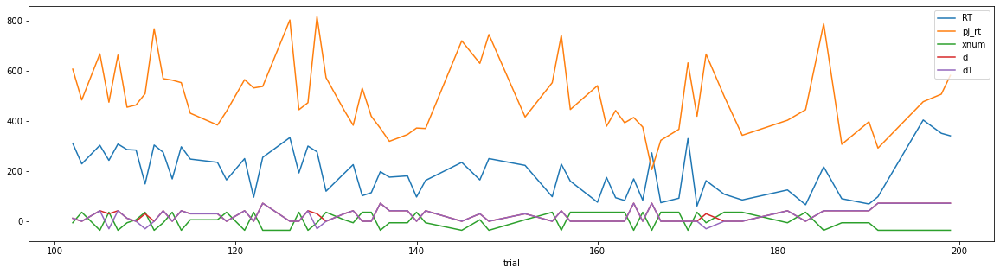

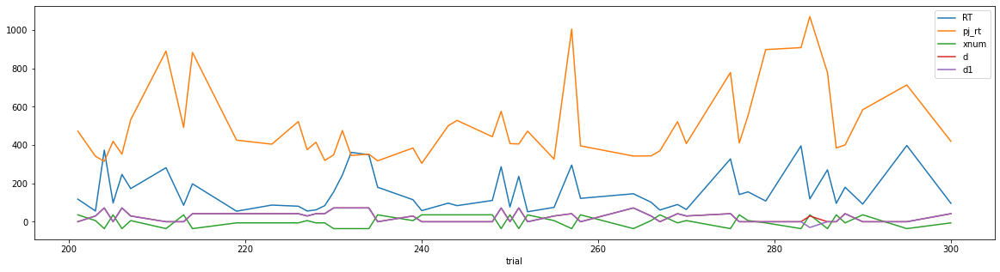

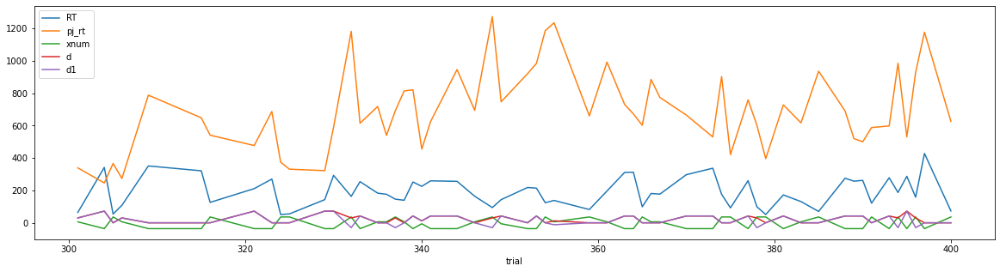

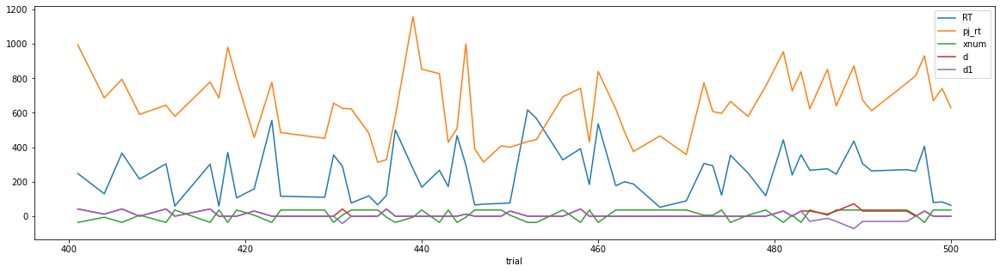

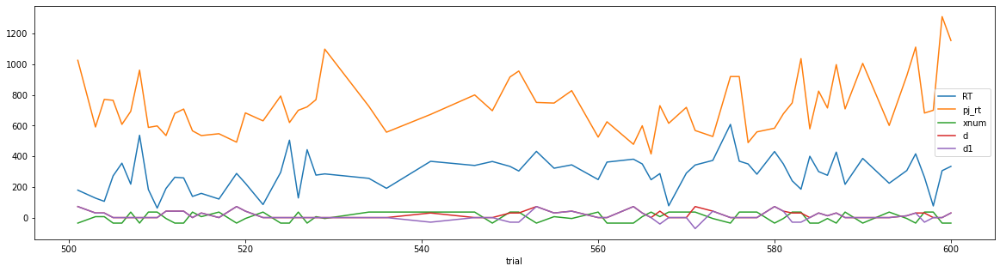

In [13]:
m.plot(figsize=(20,5))

#### 绝对差异值的分布

<AxesSubplot:xlabel='sub'>

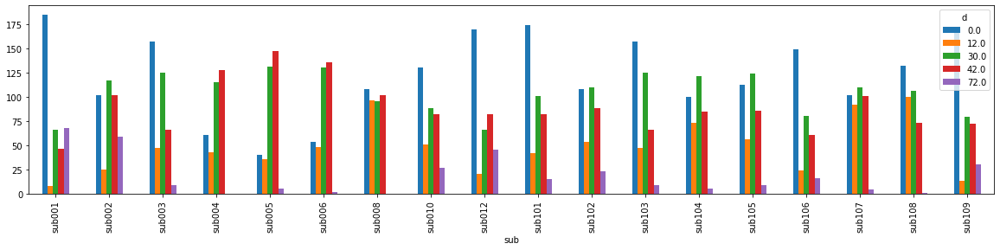

In [14]:
df.groupby('sub')['d'].value_counts().unstack().plot(kind='bar', figsize=(20, 4))

#### 相对差异值的分布

<AxesSubplot:xlabel='sub'>

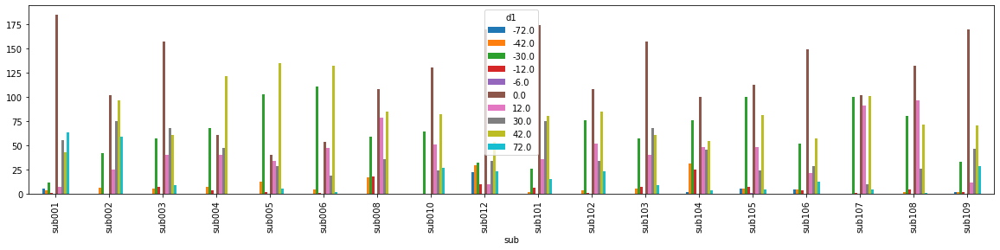

In [15]:
df.groupby('sub')['d1'].value_counts().unstack().plot(kind='bar', figsize=(20, 4))

#### 反应时的分布

sub
sub001    AxesSubplot(0.125,0.125;0.775x0.755)
sub002    AxesSubplot(0.125,0.125;0.775x0.755)
sub003    AxesSubplot(0.125,0.125;0.775x0.755)
sub004    AxesSubplot(0.125,0.125;0.775x0.755)
sub005    AxesSubplot(0.125,0.125;0.775x0.755)
sub006    AxesSubplot(0.125,0.125;0.775x0.755)
sub008    AxesSubplot(0.125,0.125;0.775x0.755)
sub010    AxesSubplot(0.125,0.125;0.775x0.755)
sub012    AxesSubplot(0.125,0.125;0.775x0.755)
sub101    AxesSubplot(0.125,0.125;0.775x0.755)
sub102    AxesSubplot(0.125,0.125;0.775x0.755)
sub103    AxesSubplot(0.125,0.125;0.775x0.755)
sub104    AxesSubplot(0.125,0.125;0.775x0.755)
sub105    AxesSubplot(0.125,0.125;0.775x0.755)
sub106    AxesSubplot(0.125,0.125;0.775x0.755)
sub107    AxesSubplot(0.125,0.125;0.775x0.755)
sub108    AxesSubplot(0.125,0.125;0.775x0.755)
sub109    AxesSubplot(0.125,0.125;0.775x0.755)
Name: RT, dtype: object

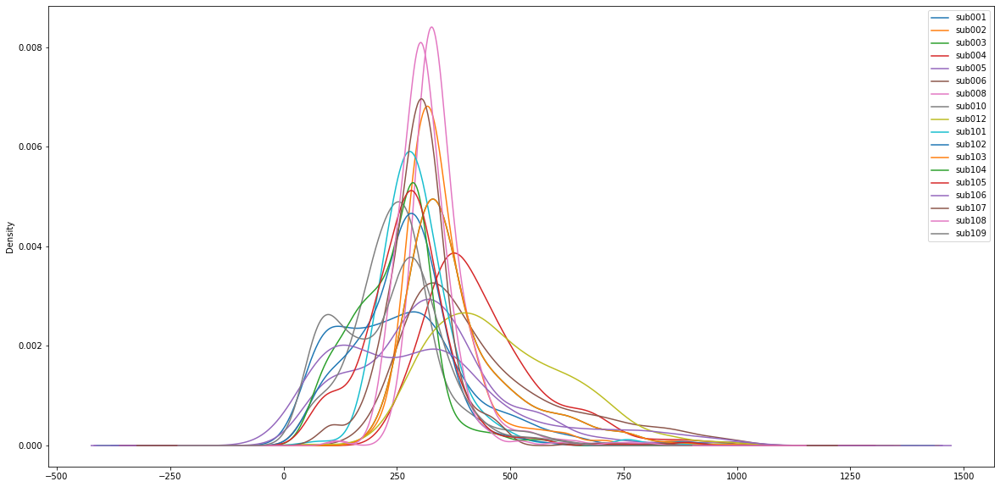

In [16]:
df.groupby('sub')['RT'].plot(kind='kde', legend=True, figsize=(20, 10))

#### 预期反应时的分布

sub
sub001    AxesSubplot(0.125,0.125;0.775x0.755)
sub002    AxesSubplot(0.125,0.125;0.775x0.755)
sub003    AxesSubplot(0.125,0.125;0.775x0.755)
sub004    AxesSubplot(0.125,0.125;0.775x0.755)
sub005    AxesSubplot(0.125,0.125;0.775x0.755)
sub006    AxesSubplot(0.125,0.125;0.775x0.755)
sub008    AxesSubplot(0.125,0.125;0.775x0.755)
sub010    AxesSubplot(0.125,0.125;0.775x0.755)
sub012    AxesSubplot(0.125,0.125;0.775x0.755)
sub101    AxesSubplot(0.125,0.125;0.775x0.755)
sub102    AxesSubplot(0.125,0.125;0.775x0.755)
sub103    AxesSubplot(0.125,0.125;0.775x0.755)
sub104    AxesSubplot(0.125,0.125;0.775x0.755)
sub105    AxesSubplot(0.125,0.125;0.775x0.755)
sub106    AxesSubplot(0.125,0.125;0.775x0.755)
sub107    AxesSubplot(0.125,0.125;0.775x0.755)
sub108    AxesSubplot(0.125,0.125;0.775x0.755)
sub109    AxesSubplot(0.125,0.125;0.775x0.755)
Name: pj_rt, dtype: object

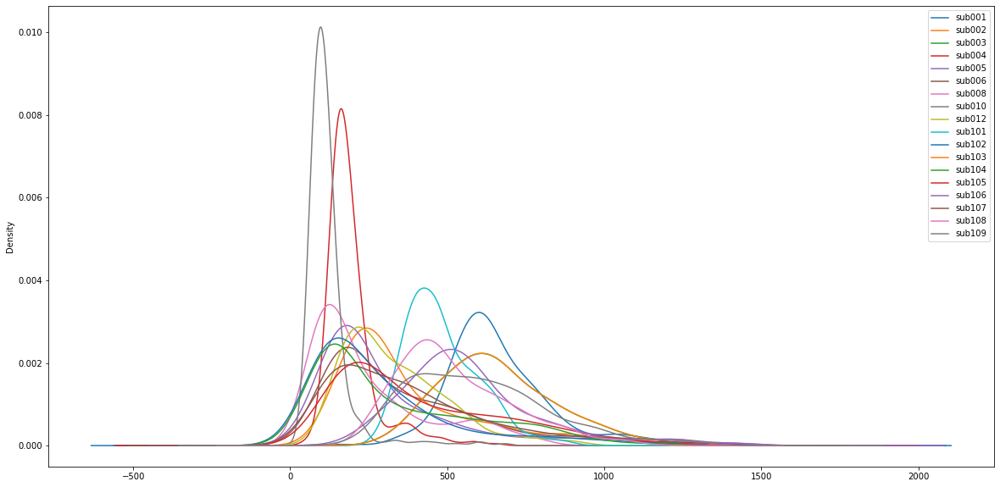

In [17]:
df.groupby('sub')['pj_rt'].plot(kind='kde', legend=True, figsize=(20, 10))

### 分组查看运动员-普通人的数据分布

#### 反应时的分布(1-普通人；2-运动员)

group
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
Name: RT, dtype: object

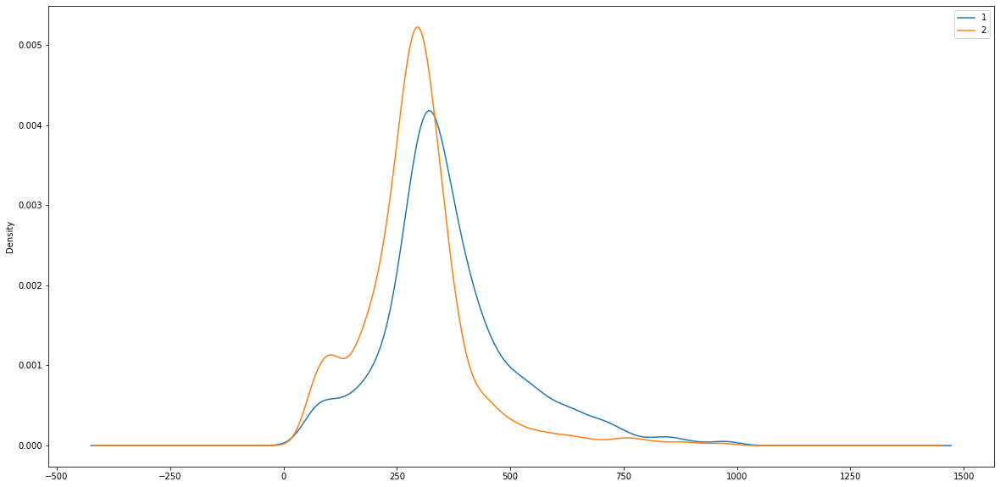

In [18]:
df.groupby('group')['RT'].plot(kind='kde', legend=True, figsize=(20, 10))

#### 预期反应时的分布(1-普通人；2-运动员)

group
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
Name: pj_rt, dtype: object

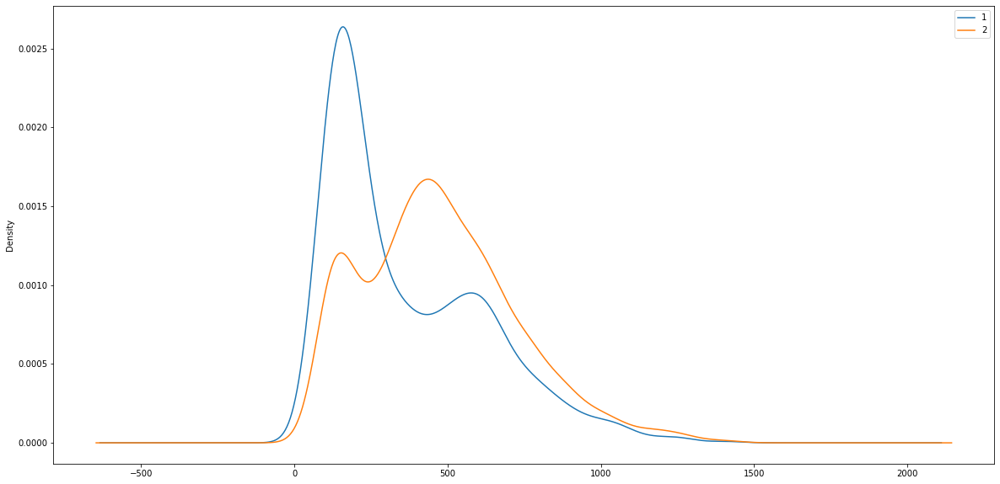

In [19]:
df.groupby('group')['pj_rt'].plot(kind='kde', legend=True, figsize=(20, 10))

#### 绝对差异的分布(1-普通人；2-运动员)

group
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
Name: d, dtype: object

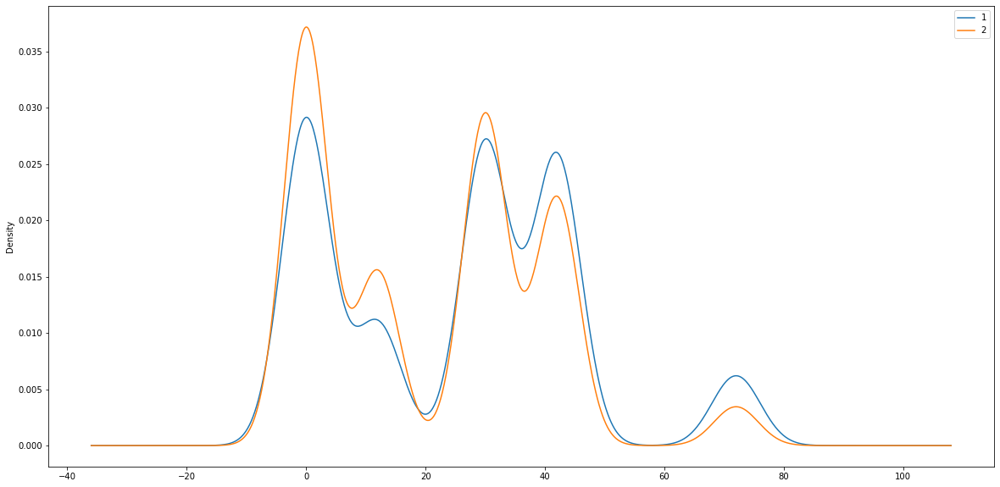

In [20]:
df.groupby('group')['d'].plot(kind='kde', legend=True, figsize=(20, 10))

#### 相对差异的分布(1-普通人；2-运动员)

group
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
Name: d1, dtype: object

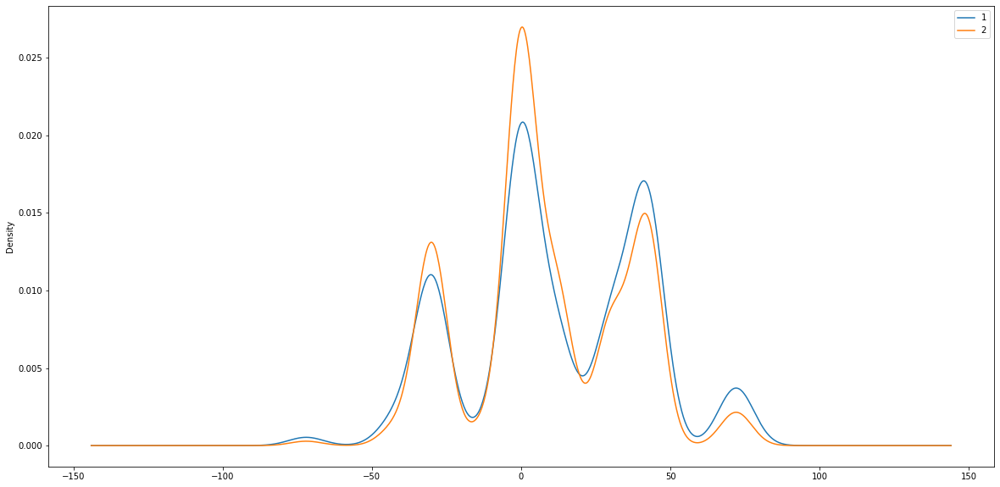

In [21]:
df.groupby('group')['d1'].plot(kind='kde', legend=True, figsize=(20, 10))

### 统计分析

#### 统计数据准备

In [41]:
m = df.groupby(by=["sub"])[["RT","pj_rt","xnum","d","d1","group"]]
t_test = pd.DataFrame(m.mean())
t_test.reset_index(inplace=True)
print(t_test)

       sub          RT       pj_rt       xnum          d         d1  group
0   sub001  254.479893  656.710456  -0.627346  23.871314  19.431635    1.0
1   sub002  351.424691  370.856790  -2.059259  30.474074  23.007407    1.0
2   sub003  391.190594  667.611386  -0.861386  19.143564   9.222772    1.0
3   sub004  439.681034  193.419540  -9.706897  26.922190  13.262248    1.0
4   sub005  318.704735  326.314763  -4.830084  30.350975  10.194986    1.0
5   sub006  434.479675  360.691057  -3.772358  28.000000   8.975610    1.0
6   sub008  347.024938  248.807980  -3.306733  20.663342   7.197007    1.0
7   sub010  252.873016  118.555556   2.603175  22.857143  12.698413    1.0
8   sub012  477.558747  333.749347 -11.295039  23.248042   2.976501    1.0
9   sub101  299.043478  484.463768   2.376812  19.463768  14.942029    2.0
10  sub102  260.772251  297.643979   2.324607  24.314136  11.654450    2.0
11  sub103  391.190594  667.611386  -0.861386  19.143564   9.222772    2.0
12  sub104  241.455729  3

#### 两组在反应时上的差异（1-普通人；2-运动员）

In [42]:
X = t_test[t_test['group'] == 1]['RT']
Y = t_test[t_test['group'] == 2]['RT']
# ttest_ind 默认为方差齐性的，equal_var = false 可以设置为方差不齐性。
print(ttest_ind(X,Y))
#用levene test检验两组数据的方差齐性，若p>0.05则认为方差是相等的。
 
from scipy.stats import levene
 
X = t_test[t_test['group'] == 1]['RT']
Y = t_test[t_test['group'] == 2]['RT']
 
print(levene(X,Y))

Ttest_indResult(statistic=2.32692891838815, pvalue=0.0334250133286788)
LeveneResult(statistic=2.5292976026278415, pvalue=0.13131204059372598)


#### 两组在预期反应时上的差异（1-普通人；2-运动员）

In [43]:
X = t_test[t_test['group'] == 1]['pj_rt']
Y = t_test[t_test['group'] == 2]['pj_rt']
# ttest_ind 默认为方差齐性的，equal_var = false 可以设置为方差不齐性。
print(ttest_ind(X,Y))
#用levene test检验两组数据的方差齐性，若p>0.05则认为方差是相等的。
 
from scipy.stats import levene
 
X = t_test[t_test['group'] == 1]['pj_rt']
Y = t_test[t_test['group'] == 2]['pj_rt']
 
print(levene(X,Y))

Ttest_indResult(statistic=-1.475354193735289, pvalue=0.15952423150029973)
LeveneResult(statistic=0.288840168935384, pvalue=0.5983606596372446)


#### 两组预期绝对差异的比较（1-普通人；2-运动员）

In [44]:
X = t_test[t_test['group'] == 1]['d']
Y = t_test[t_test['group'] == 2]['d']
# ttest_ind 默认为方差齐性的，equal_var = false 可以设置为方差不齐性。
print(ttest_ind(X,Y))
#用levene test检验两组数据的方差齐性，若p>0.05则认为方差是相等的。
 
from scipy.stats import levene
 
X = t_test[t_test['group'] == 1]['d']
Y = t_test[t_test['group'] == 2]['d']
 
print(levene(X,Y))

Ttest_indResult(statistic=2.7721992197697256, pvalue=0.013598596157333036)
LeveneResult(statistic=3.884692666590546, pvalue=0.06628042182369025)


#### 两组预期相对差异的比较（1-普通人；2-运动员）

In [45]:
X = t_test[t_test['group'] == 1]['d']
Y = t_test[t_test['group'] == 2]['d']
# ttest_ind 默认为方差齐性的，equal_var = false 可以设置为方差不齐性。
print(ttest_ind(X,Y))
#用levene test检验两组数据的方差齐性，若p>0.05则认为方差是相等的。
 
from scipy.stats import levene
 
X = t_test[t_test['group'] == 1]['d']
Y = t_test[t_test['group'] == 2]['d']
 
print(levene(X,Y))

Ttest_indResult(statistic=2.7721992197697256, pvalue=0.013598596157333036)
LeveneResult(statistic=3.884692666590546, pvalue=0.06628042182369025)
